In [48]:
import random
import json
import re
import os

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from transformers import AutoTokenizer

random.seed(6)
np.random.seed(6)


# Experiment 6 - MCQ Long answer HTML tags

For this experiment I changed the system prompt, asking the LLM to generate more text (about "thinking") and then give the final answer.


**Parameters:**
- model: deepseek-r1:1.5b
- system prompt: MCQ_system_prompt_v3.txt
- temperature: 0.1
- sampling method: (default) top-p (p=0.9)
- the output is limited to 128 tokens (shouldn't influence the results, it only cutoffs the generation)


Let's load the ground truth from the `STAR_QA_question_and_stsg_val.json` file where we extracted QA and spatio-temporal scene graphs

In [ ]:
ground_truth = []

with open('../data/datasets/STAR_QA_and_stsg_val.json') as f:
    data = json.load(f)
    ground_truth = [{
        'id': sample['question_id'],
        'choices': sample['choices'],
        'num': sample['answer'],
        'text': sample['choices'][str(sample['answer'])]
    } for sample in data]


# we keep num as str so we can directrly access choices dictionaries
gt_df = pd.DataFrame(ground_truth).astype({'id': 'string', 'num': 'string', 'text': 'string'})
gt_df.set_index('id', inplace=True)
gt_df


,choices,num,text
id,,,
Interaction_T1_13,"{'0': 'The closet/cabinet.', '1': 'The blanket...",2,The clothes.
Interaction_T1_14,"{'0': 'The blanket.', '1': 'The table.', '2': ...",2,The clothes.
Interaction_T1_31,"{'0': 'The pillow.', '1': 'The bag.', '2': 'Th...",2,The clothes.
Interaction_T1_32,"{'0': 'The food.', '1': 'The shoe.', '2': 'The...",1,The shoe.
Interaction_T1_40,"{'0': 'The broom.', '1': 'The closet/cabinet.'...",1,The closet/cabinet.
...,...,...,...
Feasibility_T6_1453,"{'0': 'Wash the table.', '1': 'Take the box.',...",0,Wash the table.
Feasibility_T6_1454,"{'0': 'Take the towel.', '1': 'Throw the bag.'...",0,Take the towel.
Feasibility_T6_1455,"{'0': 'Throw the bag.', '1': 'Wash the table.'...",1,Wash the table.


Loading the responses from the LLM

In [50]:
# needed to modify the output file because of the bug
# I introduced in the code
predictions = []
with open('../outputs/responses_deepseek-r1:1.5b_20250218_18:07:17.jsonl') as f:
    predictions = [json.loads(line) for line in f.readlines()]

# transforming the id key from `qid` to `id` for consistency and `response` to `answer`
predictions_df = pd.DataFrame(predictions, dtype='string').rename(columns={'qid':'id', 'response':'answer'})
predictions_df.set_index('id', inplace=True)
predictions_df


,answer
id,
Interaction_T1_13,"<think> Okay, so I'm trying to figure out this..."
Interaction_T1_14,"<think> Alright, let's tackle this question st..."
Interaction_T1_31,"<think> Okay, so I need to figure out which ob..."
Interaction_T1_32,"<think> Okay, so I'm trying to figure out whic..."
Interaction_T1_40,"<think> Okay, so I'm trying to figure out this..."
...,...
Feasibility_T6_1453,"<think> Okay, so I'm trying to figure out what..."
Feasibility_T6_1454,"<think> Alright, let's tackle this question st..."
Feasibility_T6_1455,"<think> Okay, so I need to figure out what the..."


In [51]:
predictions_df.iloc[0:20]['answer'].apply(print)


<think>
Okay, so I'm trying to figure out this question about a Spatio-Temporal Scene Graph. The question is asking which object was tidied up by the person, and there are four alternatives: 0. The closet/cabinet, 1. The blanket, 2. The clothes, and 3. The table.

First, I need to understand what a Spatio-Temporal Scene Graph is. From the input example provided, it looks like each scene in the graph is represented as a tuple with subject, relationship, and object. So, for instance, ['person - on_the_side_of - clothes'] means that a person is on the side of something which is a cloth.

The task here is to look through all these scenes and see if any of them involve tidying up by a person. The key part is figuring out what "tidied up" means in this context. It probably refers to an object being cleaned or organized, so maybe it's the last item in the tuple that indicates something done.

Looking at each scene:

0. ['person - on_the_side_of - clothes'] – This seems like a person is holdin

id
Interaction_T1_13     None
Interaction_T1_14     None
Interaction_T1_31     None
Interaction_T1_32     None
Interaction_T1_40     None
Interaction_T1_43     None
Interaction_T1_70     None
Interaction_T1_71     None
Interaction_T1_76     None
Interaction_T1_78     None
Interaction_T1_81     None
Interaction_T1_95     None
Interaction_T1_100    None
Interaction_T1_101    None
Interaction_T1_104    None
Interaction_T1_106    None
Interaction_T1_111    None
Interaction_T1_137    None
Interaction_T1_139    None
Interaction_T1_147    None
Name: answer, dtype: object

In [52]:
# Check if the the template is somewhere in the answer
html_tags_pattern =  r'<Final answer>.*</Final answer>'
html_tags_mask = predictions_df['answer'].str.contains(html_tags_pattern, case=False, regex=True, flags=re.DOTALL)


print(f"Answer following the template: {html_tags_mask.value_counts()[True]}\n"
      f"{html_tags_mask.value_counts()[True]/predictions_df.size:.2%} of the total")

print(f"\nOnly {html_tags_mask.value_counts()[False]} samples do not contain the answer in the response with the specified format")


Answer following the template: 4050
57.06% of the total

Only 3048 samples do not contain the answer in the response with the specified format


In [53]:
# Check if the the template is somewhere in the answer
html_tags_pattern = r'<Final answer>\s*A:\s*\d\.\s*((?:\w+(?:\s|\/)?){,10}\.)\s*</Final answer>'
html_tags_mask = predictions_df['answer'].str.contains(html_tags_pattern, case=False, regex=True, flags=re.DOTALL)


print(f"Answer following the template: {html_tags_mask.value_counts()[True]}\n"
      f"{html_tags_mask.value_counts()[True]/predictions_df.size:.2%} of the total")

print(f"\nOnly {html_tags_mask.value_counts()[False]} samples do not contain the answer in the response with the specified format")


Answer following the template: 3700
52.13% of the total

Only 3398 samples do not contain the answer in the response with the specified format


/tmp/ipykernel_235573/2145752222.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  html_tags_mask = predictions_df['answer'].str.contains(html_tags_pattern, case=False, regex=True, flags=re.DOTALL)


Let's start by viewing how many answers follow the template:

In [54]:
# Check if the the template is somewhere in the answer
ans_regex_pattern = r'A:\s*(?:\d\.\s+)((?:\w+(?:\s|\/)?){,10}\.?)'
contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, case=False, regex=True, flags=re.DOTALL)


print(f"Answer following the template: {contains_answer.value_counts()[True]}\n"
      f"{contains_answer.value_counts()[True]/predictions_df.size:.2%} of the total")

print(f"\nOnly {contains_answer.value_counts()[False]} samples do not contain the answer in the response with the specified format")


/tmp/ipykernel_235573/247060311.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, case=False, regex=True, flags=re.DOTALL)


Answer following the template: 5316
74.89% of the total

Only 1782 samples do not contain the answer in the response with the specified format


In [55]:
# Check that contains answer is subset of html_tags
assert (html_tags_mask & contains_answer).sum() == html_tags_mask.sum()


## Non-conforming responses

In [56]:
predictions_df.loc[~html_tags_mask].iloc[:5]['answer'].apply(lambda x: print(x, '\n\n'))


<think>
Alright, let's tackle this question step by step. The question is asking which object was tidied up by the person. I have a Spatio-Temporal Scene Graph (STSG) provided, which is a list of scenes ordered chronologically.

First, I need to understand what each scene in the STSG represents. Each entry is a tuple like ['person - holding - towel'], which means a person is holding a towel at that specific time. The order of these tuples indicates the sequence of events over time.

Looking at the first few entries:
1. ['person - holding - towel']
2. ['person - in_front_of - towel']
3. ['person - holding - clothes']

I notice that each subsequent entry starts with 'person' followed by a verb and then an object, which is either a towel or clothes. This suggests that the person is tidying their room, moving around to tidy different objects.

Now, I need to figure out what was tidied up by the person. The options are:
0. The blanket.
1. The table.
2. The clothes.
3. The closet/cabinet.

F

id
Interaction_T1_14    None
Interaction_T1_40    None
Interaction_T1_70    None
Interaction_T1_71    None
Interaction_T1_78    None
Name: answer, dtype: object

In [57]:
predictions_df.loc[~contains_answer].iloc[:100]['answer'].apply(lambda x: print(x, '\n\n'))


<think>
Okay, so I'm trying to figure out which object was put down by the person based on this Spatio-Temporal Scene Graph. Let me break it down step by step.

First, looking at the STSG provided, it's a list of tuples that represent events happening in sequence. Each tuple has three parts: subject, relationship, and object. The subjects are people holding shoes or wearing shoes, standing on floors, etc. The relationships include actions like holding, standing_on, beneath, etc.

I need to find the event where someone put down an object. That would be when a person is placing something onto another surface. So I'm looking for a tuple that starts with "put down" or similar action.

Looking through each tuple:

1. ['person - holding - shoe'] – This shows someone holding a shoe.
2. ['person - standing_on - floor'] – Someone is standing on the floor.
3. ['person - beneath - floor'] – Someone is below the floor.
4. ['person - wearing - shoe'] – Someone is wearing a shoe.

None of these dire

id
Interaction_T1_71      None
Interaction_T1_81      None
Interaction_T1_137     None
Interaction_T1_197     None
Interaction_T1_210     None
                       ... 
Interaction_T1_2599    None
Interaction_T1_2682    None
Interaction_T1_2699    None
Interaction_T1_2720    None
Interaction_T1_2724    None
Name: answer, Length: 100, dtype: object

In [58]:
# Note: to access meta-llama you have to first accept the licence agreement
hugg_key = os.environ['HUGGINGFACE_KEY']

tokenizer = AutoTokenizer.from_pretrained(
                'meta-llama/Llama-3.2-3B-Instruct', 
                token=hugg_key)


In [59]:
resp_token_len = pd.Series(index=predictions_df.index)

for index, row in predictions_df.iterrows():
    resp_token_len.loc[index] = len(tokenizer.encode(row['answer']))

resp_token_len.sort_values().value_counts(sort=False)


/tmp/ipykernel_235573/4005420109.py:1: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  resp_token_len = pd.Series(index=predictions_df.index)


90.0       1
108.0      1
110.0      1
118.0      1
122.0      1
          ..
4099.0    72
4100.0     5
4103.0     1
4105.0     1
4123.0     1
Length: 1294, dtype: int64

The responses with a token length of 12 are those that caused an error during generation (mainly due to time-out 4mins):

In [60]:
(predictions_df[resp_token_len == 12] == "Error while generating the response. Look at the logs.").all()


answer    True
dtype: bool

In [61]:

print(f"Number of responses that are not conformat to the regex: {predictions_df[~contains_answer].shape[0]}")
print(f"Number of responses that took too long to answer:        {(resp_token_len == 12).sum()}")


Number of responses that are not conformat to the regex: 1782
Number of responses that took too long to answer:        0


In [62]:
predictions_df[(~contains_answer) & ~(resp_token_len == 12)]['answer'].apply(lambda x: print(x, '\n\n'))


<think>
Okay, so I'm trying to figure out which object was put down by the person based on this Spatio-Temporal Scene Graph. Let me break it down step by step.

First, looking at the STSG provided, it's a list of tuples that represent events happening in sequence. Each tuple has three parts: subject, relationship, and object. The subjects are people holding shoes or wearing shoes, standing on floors, etc. The relationships include actions like holding, standing_on, beneath, etc.

I need to find the event where someone put down an object. That would be when a person is placing something onto another surface. So I'm looking for a tuple that starts with "put down" or similar action.

Looking through each tuple:

1. ['person - holding - shoe'] – This shows someone holding a shoe.
2. ['person - standing_on - floor'] – Someone is standing on the floor.
3. ['person - beneath - floor'] – Someone is below the floor.
4. ['person - wearing - shoe'] – Someone is wearing a shoe.

None of these dire

id
Interaction_T1_71      None
Interaction_T1_81      None
Interaction_T1_137     None
Interaction_T1_197     None
Interaction_T1_210     None
                       ... 
Feasibility_T6_1391    None
Feasibility_T6_1392    None
Feasibility_T6_1403    None
Feasibility_T6_1448    None
Feasibility_T6_1455    None
Name: answer, Length: 1782, dtype: object

## Distribution of generated response lengths measured in tokens

count    7098.000000
mean      782.307129
std       969.641184
min        90.000000
25%       329.000000
50%       453.000000
75%       695.000000
max      4123.000000
dtype: float64

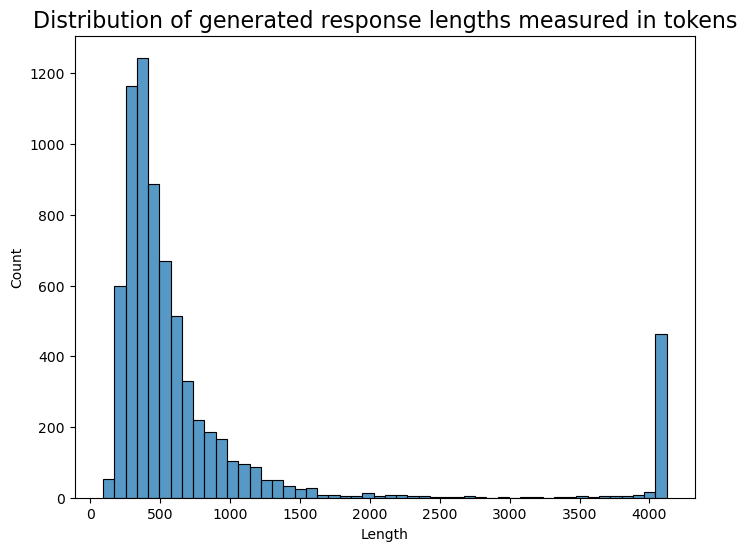

In [63]:
plt.figure(figsize=(8, 6))
sns.histplot(resp_token_len, bins=50)
plt.title("Distribution of generated response lengths measured in tokens", fontsize=16)
plt.xlabel("Length")
plt.ylabel("Count")

resp_token_len.describe()


## Extracting the answers

Let's extract the the answers from the generated texts which do contain an answer:

In [64]:
ans_df = predictions_df.loc[contains_answer]['answer'].str.extract(ans_regex_pattern)
ans_df.rename(columns={0: 'text'}, inplace=True)

ans_df['text'] = ans_df['text'].str.strip()
ans_df


,text
id,
Interaction_T1_13,The closet/cabinet.
Interaction_T1_14,The clothes.
Interaction_T1_31,The clothes.
Interaction_T1_32,The shoe.
Interaction_T1_40,The blanket.
...,...
Feasibility_T6_1449,The clothes.
Feasibility_T6_1453,Open the bag.
Feasibility_T6_1454,Hold the towel.


In [65]:
freq = ans_df['text'].value_counts().reset_index()
freq.columns = ['word', 'freq']

print(f"We have {freq.size} unique answers")


We have 1132 unique answers


In [66]:
ans_df['text'].value_counts()


The clothes.                                 280
Put down.                                    243
Took.                                        241
The towel.                                   174
Threw.                                       152
                                            ... 
Lie on the floor.                              1
Wash the mirror.                               1
Enter the closet while holding the broom.      1
Move to a different location                   1
Hold the towel.                                1
Name: text, Length: 566, dtype: Int64

<AxesSubplot: xlabel='freq', ylabel='word'>

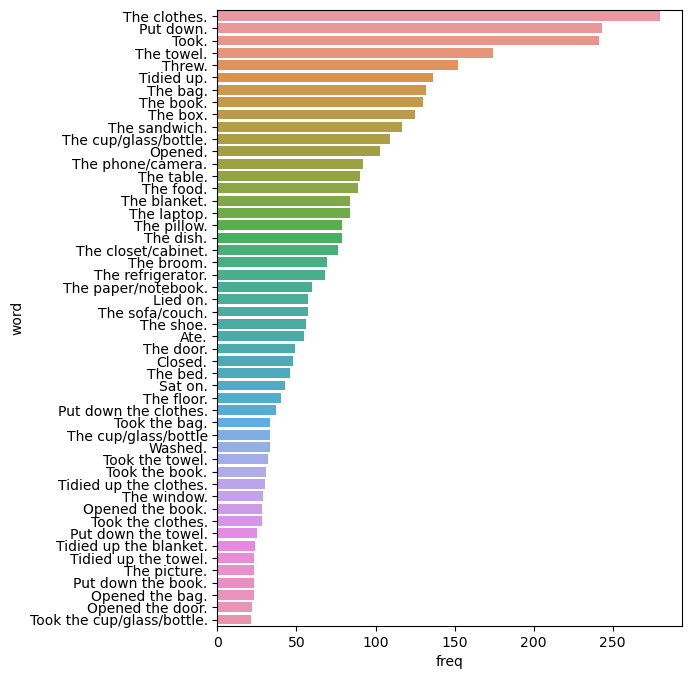

In [67]:
plt.figure(figsize=(6, 8))
sns.barplot(data=freq.sort_values('freq', ascending=False)[:50], x='freq', y='word')


Let's do some visualization also for the ground truth data

In [68]:
print(f"We have {gt_df['text'].nunique()} unique answers")


We have 198 unique answers


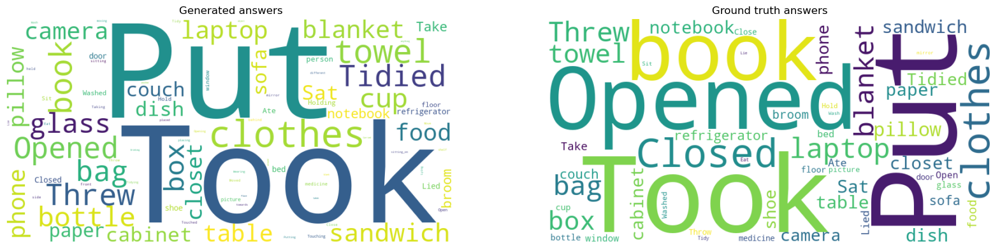

In [69]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))

# predictions worldcloud
pred_text = ' '.join(ans_df['text'].astype(str))
wordcloud1 = WordCloud(width=800,
                       height=400,
                       background_color='white',
                       collocations=False).generate(pred_text)
ax1.imshow(wordcloud1, interpolation='bilinear')
ax1.axis('off')
ax1.set_title('Generated answers')

# ground truth wordcloud 
gt_text = ' '.join(gt_df['text'].astype(str))
wordcloud2 = WordCloud(width=800,
                       height=400,
                       background_color='white', 
                       collocations=False).generate(gt_text)
ax2.imshow(wordcloud2, interpolation='bilinear')
ax2.axis('off')
ax2.set_title('Ground truth answers')

plt.show()


<AxesSubplot: xlabel='freq', ylabel='word'>

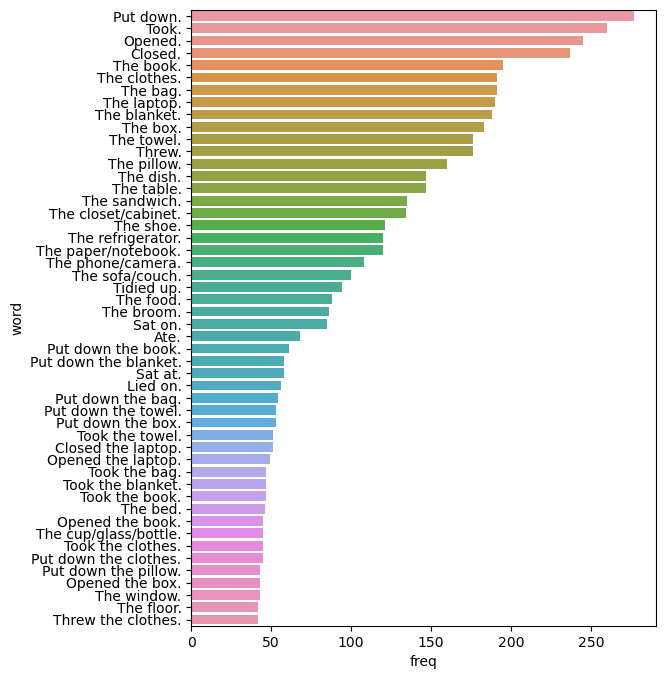

In [70]:
freq = gt_df['text'].value_counts().reset_index()
freq.columns = ['word', 'freq']

plt.figure(figsize=(6, 8))
sns.barplot(data=freq.sort_values('freq', ascending=False)[:50], x='freq', y='word')


In [71]:
# Inner join - keeps only indices present in both series

ans_df.rename(columns={'text': 'pred_text'}, inplace=True)
eval_df = gt_df.join(
    ans_df, 
    how='inner' # we account also for samples without answers
)

eval_df.shape


(5316, 4)

In [72]:
def accuracy(eval_df, on_what='text'):
    hits_text = (eval_df[f'pred_{on_what}'] == eval_df[on_what]).sum()
    

    return hits_text/eval_df.shape[0]


In [73]:
text_acc = accuracy(eval_df)

print(f"Text Accuracy: {text_acc:.2%}")


Text Accuracy: 37.00%


In [74]:
eval_df[eval_df['text'] == eval_df['pred_text']]


,choices,num,text,pred_text
id,,,,
Interaction_T1_14,"{'0': 'The blanket.', '1': 'The table.', '2': ...",2,The clothes.,The clothes.
Interaction_T1_31,"{'0': 'The pillow.', '1': 'The bag.', '2': 'Th...",2,The clothes.,The clothes.
Interaction_T1_32,"{'0': 'The food.', '1': 'The shoe.', '2': 'The...",1,The shoe.,The shoe.
Interaction_T1_78,"{'0': 'The laptop.', '1': 'The refrigerator.',...",0,The laptop.,The laptop.
Interaction_T1_95,"{'0': 'The dish.', '1': 'The clothes.', '2': '...",0,The dish.,The dish.
...,...,...,...,...
Feasibility_T6_1375,"{'0': 'Put down the clothes.', '1': 'Take the ...",2,Sit at the table.,Sit at the table.
Feasibility_T6_1405,"{'0': 'Hold the picture.', '1': 'Wash the mirr...",2,Take the pillow.,Take the pillow.
Feasibility_T6_1412,"{'0': 'Put down the box.', '1': 'Hold the book...",1,Hold the book.,Hold the book.


check if the equality with NA result in a false or is skipped

In [75]:
real_acc = accuracy(eval_df) * eval_df.shape[0] / gt_df.shape[0]

print(f"Real Accuracy: {real_acc:.2%}")


Real Accuracy: 27.71%


In [76]:
def print_acc(eval_df, acc_fn):
    print(f"{'Question type':<15}{'Total':^15}{'Accuracy':^10}\n")

    total = eval_df.index.str.startswith('Interaction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Interaction')])
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Sequence').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Sequence')])
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Prediction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Prediction')])
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Feasibility').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Feasibility')])
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")


In [77]:
print_acc(eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction         1869        37.99%  
Sequence            2685        35.75%  
Prediction           429        41.96%  
Feasibility          333        35.14%  


In [78]:
index_intersect = predictions_df[html_tags_mask].index.intersection(eval_df.index)
print_acc(eval_df.loc[index_intersect], accuracy)


Question type       Total      Accuracy 

Interaction         1282        40.02%  
Sequence            1949        39.05%  
Prediction           279        44.44%  
Feasibility          190        41.58%  


In [79]:
# % of answers conforming to template per category

def print_ans_perc(eval_df, gt_df):
    print(f"{'Question type':<15}{'Total':^15}{'Answered':^10}\n")

    total = gt_df.index.str.startswith('Interaction').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Interaction')].index))/total
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Sequence').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Sequence')].index))/total
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Prediction').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Prediction')].index))/total
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Feasibility').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Feasibility')].index))/total
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.shape[0]
    acc = eval_df.shape[0]/total
    print(f"{'Overall':<15}{total:^15}{acc:^10.2%}")

print_ans_perc(eval_df, gt_df)


Question type       Total      Answered 

Interaction         2398        77.94%  
Sequence            3586        74.87%  
Prediction           624        68.75%  
Feasibility          490        67.96%  
Overall             7098        74.89%  
